<a href="https://colab.research.google.com/github/Elcejas77/Ejercicios/blob/main/Taller_3_Parcial3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [33]:
#title FUNCIONES Y LIBRERÍAS

import soundfile as sf
import scipy
import numpy as np


from scipy.signal import butter
from scipy.signal import cheby1
from scipy.signal import cheby2
from scipy.signal import bessel
from scipy.signal import ellip
from scipy.signal import firwin
from scipy.signal import lfilter, filtfilt
from scipy.signal import freqz_zpk
from IPython.display import Markdown as md
from IPython.display import Audio
from matplotlib import pyplot as plt
from matplotlib.patches import Circle

In [2]:
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 11.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 42.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 17.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.5/162.5 kB 22.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.6/62.6 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.6/104.6 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 93.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.1/142.1 kB 20.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.5/61.5 kB 7.3 MB/s eta 0:00:00
  Created w

In [34]:
# Realizamos un programa para comenzar a descargar la canción dónde se leerá el link y el nombre de esta

import os
import yt_dlp as youtube_dl
def download_ytvid_as_mp3(video_url,name):
    #video_url = input("enter url of youtube video:")
    video_info = youtube_dl.YoutubeDL().extract_info(url = video_url,download=False)
    filename = f"{name}.mp3"
    options={
        'format':'bestaudio/best',
        'keepvideo':False,
        'outtmpl':filename,
    }

    with youtube_dl.YoutubeDL(options) as ydl:
        ydl.download([video_info['webpage_url']])

    print("Download complete... {}".format(filename))

In [35]:
link_= ["https://www.youtube.com/watch?v=J8NrkPLDi_k"]
name_ = ['Alguien como tu'
        ]
for name,link in zip(name_,link_):
    print(name)
    download_ytvid_as_mp3(link,name)

Alguien como tu
[youtube] Extracting URL: https://www.youtube.com/watch?v=J8NrkPLDi_k
[youtube] J8NrkPLDi_k: Downloading webpage
[youtube] J8NrkPLDi_k: Downloading ios player API JSON
[youtube] J8NrkPLDi_k: Downloading android player API JSON
[youtube] J8NrkPLDi_k: Downloading m3u8 information
[youtube] Extracting URL: https://www.youtube.com/watch?v=J8NrkPLDi_k
[youtube] J8NrkPLDi_k: Downloading webpage
[youtube] J8NrkPLDi_k: Downloading ios player API JSON
[youtube] J8NrkPLDi_k: Downloading android player API JSON
[youtube] J8NrkPLDi_k: Downloading m3u8 information
[info] J8NrkPLDi_k: Downloading 1 format(s): 251
[download] Alguien como tu.mp3 has already been downloaded
[download] 100% of    3.67MiB
Download complete... Alguien como tu.mp3


In [36]:
# Instalamos la extensión soundfile
!pip install soundfile

In [37]:
import subprocess

for name in name_:
    subprocess.call(['ffmpeg','-y', '-i', name+'.mp3',
                   name+'.wav'])

In [38]:
import soundfile as sf # para instalar pip install soundfile
#lee archivos wav
for name in name_:
    nombre_out = "output.wav"
    x, fs = sf.read(name+'.wav')

    print('Frecuencia de muestreo %.2f[Hz]\naudio %s' % (fs,name+'.wav'))

print('Frecuencia de muestreo %.2f[Hz]' %(fs))
xpro = x.copy()

#@markdown Escoja los siguientes tiempos (en segundos)

inicial =  80# @param
final =  90# @param

#@markdown Escoja las frecuencias de corte

corte1= 1000 # @param
corte2= 5000 # @param

ti = inicial
tf = final
xs = xpro[int(ti*fs):int((tf*fs)),:]
K= int(len(xs)/2) + 1
print(f'Audio original:')
Audio([xs[:,1], xs[:,0]],rate=fs) #segmento de audio

Frecuencia de muestreo 48000.00[Hz]
audio Alguien como tu.wav
Frecuencia de muestreo 48000.00[Hz]
Audio original:


In [43]:
#@title Filtro Butterworth
#Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones
#Filtrado paso bajo: lowpass
#Filtrado paso alto: highpass
#Filtrado pasa banda: bandpass
#Filtrado rechaza banda: bandstop

filtrado=str(input("ingrese el tipo de filtro "))
N_orden=2

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]

num, den = butter(N_orden, Wn=wn, btype=filtrado, output='ba',fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

ingrese el tipo de filtro bandpass
Audio filtrado


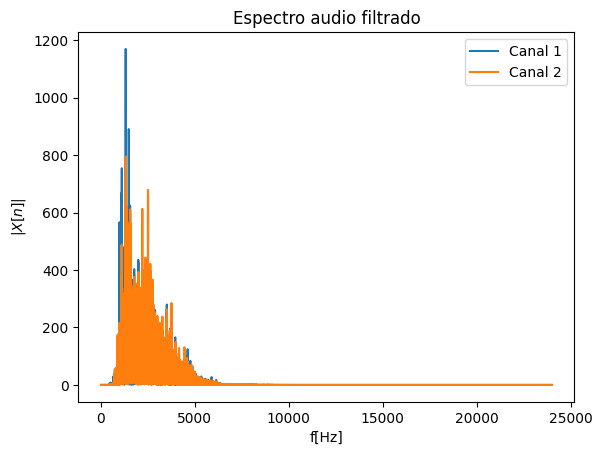

In [12]:
#@title Espectro con el filtro

xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0) # fft por cada columna de xpro
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [14]:
#@title Filtro Chebyshev I
#@markdown Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones
#@markdown * Filtrado paso bajo: lowpass
#@markdown * Filtrado paso alto: highpass
#@markdown * Filtrado pasa banda: bandpass
#@markdown * Filtrado rechaza banda: bandstop

filtrado="bandpass" #@param {type:'string'}
N_orden=2 #@param {type:"slider",min:1,max:10}
ripple=7 #@param {type:"slider",min:1,max:30}

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]

num, den=cheby1(N_orden, rp=ripple, Wn=wn, btype=filtrado, output='ba', fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Audio filtrado


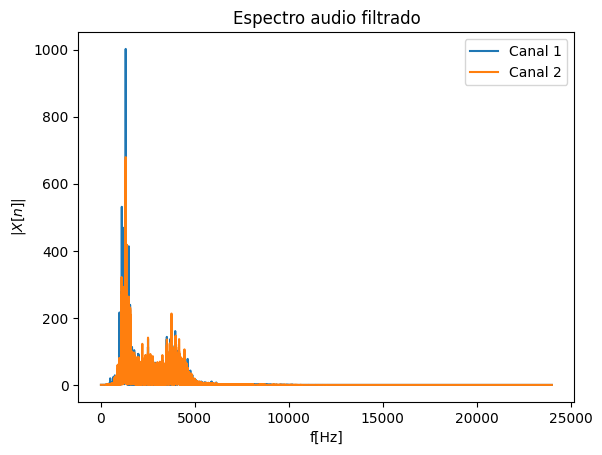

In [15]:
#@title Espectro con el filtro

xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [17]:
#@title Filtro Chebyshev II
#@markdown Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones
#@markdown * Filtrado paso bajo: lowpass
#@markdown * Filtrado paso alto: highpass
#@markdown * Filtrado pasa banda: bandpass
#@markdown * Filtrado rechaza banda: bandstop

filtrado="bandpass" #@param {type:'string'}
N_orden=6 #@param {type:"slider",min:1,max:10}
ripple=10 #@param {type:"slider",min:1,max:30}

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]

num, den = cheby2(N_orden, rs=ripple, Wn=wn, btype=filtrado, output='ba', fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Audio filtrado


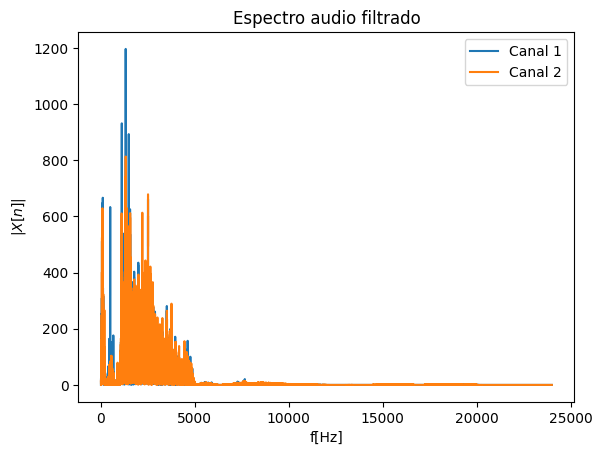

In [18]:
#@title Espectro con el filtro

xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [19]:
#@title Filtro Bessel
#@markdown Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones
#@markdown * Filtrado paso bajo: lowpass
#@markdown * Filtrado paso alto: highpass
#@markdown * Filtrado pasa banda: bandpass
#@markdown * Filtrado rechaza banda: bandstop

filtrado="bandpass" #@param {type:"string"}
N_orden=6 #@param {type:"slider",min:1,max:10}
normali="mag"#@param {type:"string"}

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
if filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]
num, den = bessel(N_orden, wn, btype=filtrado, output='ba', norm = normali, fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado:')
Audio([xf[:,1], xf[:,0]],rate=fs)

Audio filtrado:


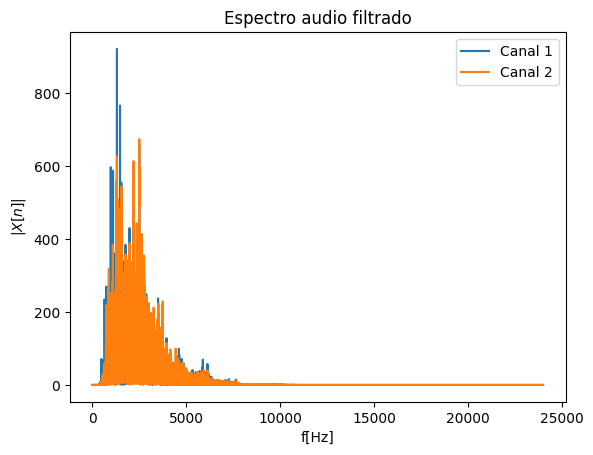

In [20]:
#@title Espectro con el filtro

xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [32]:
#@title Filtro Elíptico
#@markdown Escriba el tipo de filtrado que desea hacer según las siguientes instrucciones
#@markdown * Filtrado paso bajo: lowpass
#@markdown * Filtrado paso alto: highpass
#@markdown * Filtrado pasa banda: bandpass
#@markdown * Filtrado rechaza banda: bandstop

#@markdown *Para 'riple_pass y stop' la entrada deben ser en db*

filtrado="highpass" #@param {type:'string'}
N_orden=6 #@param {type:"slider",min:1,max:1000}
ripple_pass=3 #@param {type:"slider",min:1,max:3000}
ripple_stop=6 #@param {type:"slider",min:1,max:3000}

wn=[1000,8000]
if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
if filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]
num, den=ellip(N_orden, rp=ripple_pass, rs=ripple_stop, Wn=wn, btype=filtrado, fs=fs)

xf=filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Audio filtrado


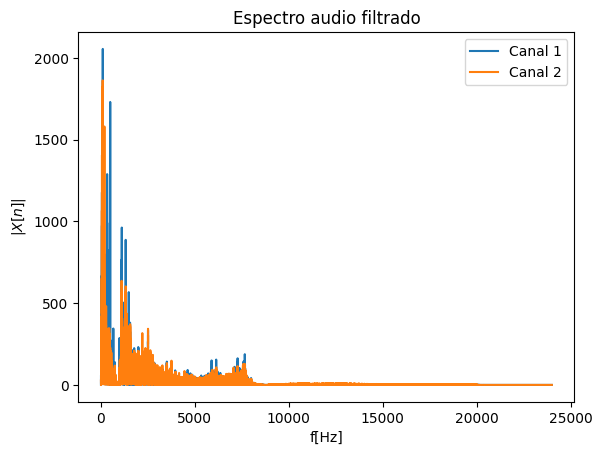

In [22]:
#@title Espectro con el filtro

xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

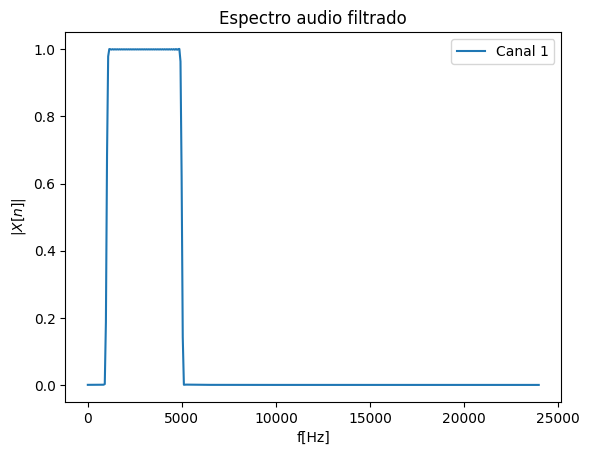

In [26]:
#@title Filtro Firwin Pasa banda



N_orden=799 #@param {type:"slider",min:1,max:1000}

coeff_fir=firwin(N_orden, [corte1, corte2], pass_zero=False, fs=fs)

xpro=coeff_fir.copy()
Xw=np.fft.rfft(coeff_fir,axis=0)
vf=np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

